##🔹 Part 1: Setup and Installations



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# ⚙️ Install Cellpose
!pip install cellpose --quiet

# ⚙️ Install Segment Anything (SAM) and other required packages
!pip install git+https://github.com/facebookresearch/segment-anything.git --quiet
!pip install opencv-python matplotlib --quiet

# 📥 Download SAM ViT-B checkpoint
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth -O sam_vit_b.pth


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.0/211.0 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 120.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 81.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1

In [ ]:
import os
from glob import glob
from cellpose import models, io
import numpy as np
import matplotlib.pyplot as plt
import cv2




Welcome to CellposeSAM, cellpose v
cellpose version: 	4.0.4 
platform:       	linux 
python version: 	3.11.12 
torch version:  	2.6.0+cu124! The neural network component of
CPSAM is much larger than in previous versions and CPU excution is slow. 
We encourage users to use GPU/MPS if available. 




## Part 2: Load DAPI Images and Run Cellpose Segmentation


Found 10 DAPI images


100%|██████████| 1.15G/1.15G [00:08<00:00, 139MB/s]


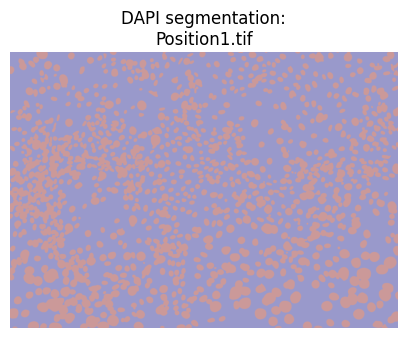

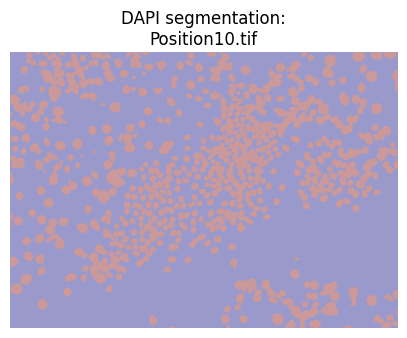

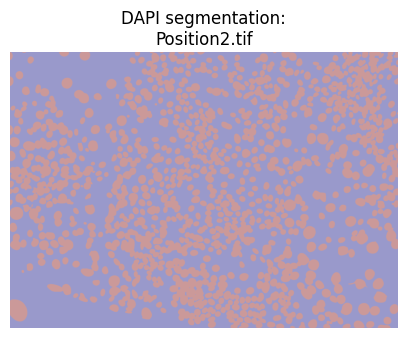

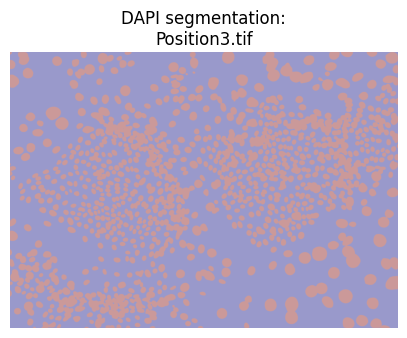

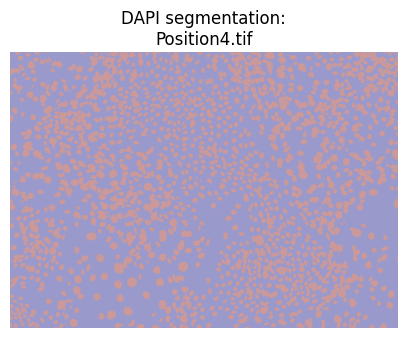

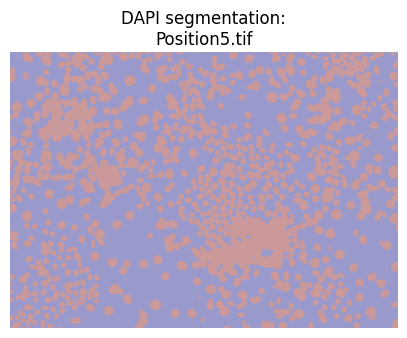

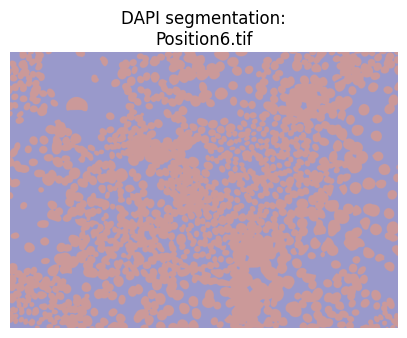

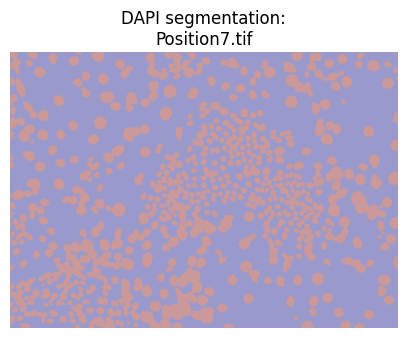

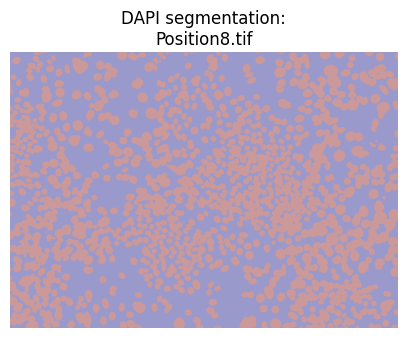

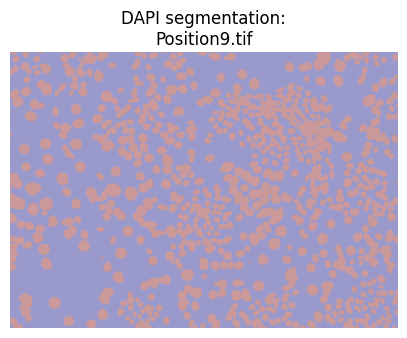

In [ ]:
## Part 2: Load DAPI Images and Run Cellpose Segmentation

# Path to DAPI images
dapi_path = '/content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/DAPI_Stained'
dapi_images = sorted(glob(os.path.join(dapi_path, '*.tif')))

print(f"Found {len(dapi_images)} DAPI images")

# Load Cellpose model
model = models.CellposeModel(gpu=True)

# Run Cellpose with progress update
all_masks = []
for img_path in dapi_images:
    img = io.imread(img_path)
    masks, _, _ = model.eval(img, diameter=None)
    all_masks.append(masks)

    # —— PRINT / SHOW segmentation ——
    plt.figure(figsize=(5,5))
    plt.imshow(masks>0, cmap='jet', alpha=0.4)    # overlay mask
    plt.title(f"DAPI segmentation:\n{os.path.basename(img_path)}")
    plt.axis('off')
    plt.show()

## Part 3: Expression levels of segmented cells

Found 10 P63 images


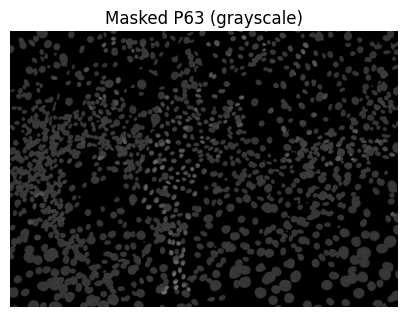

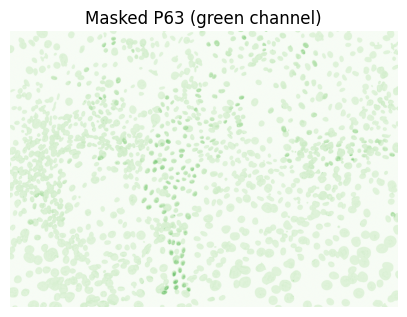

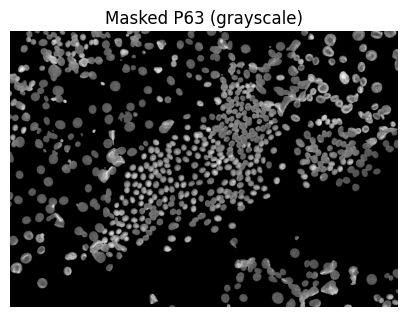

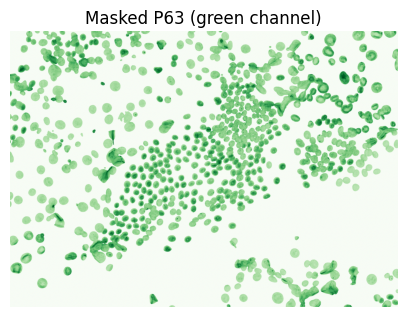

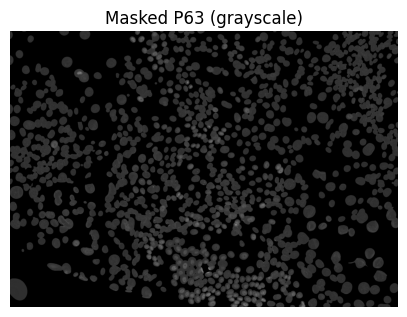

...

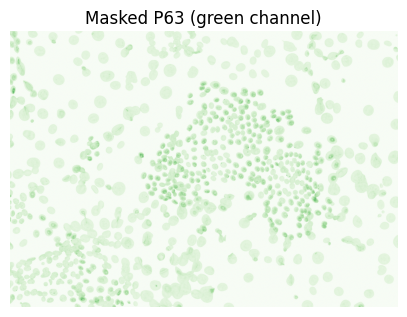

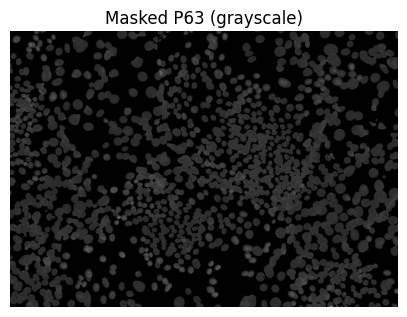

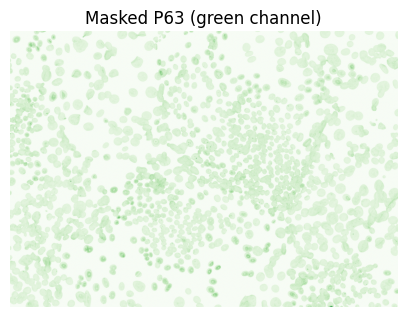

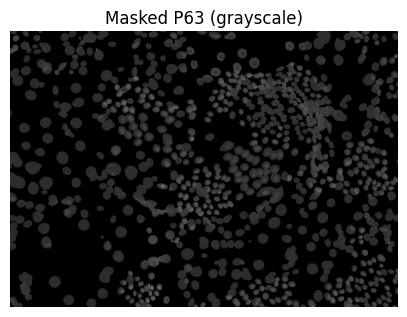

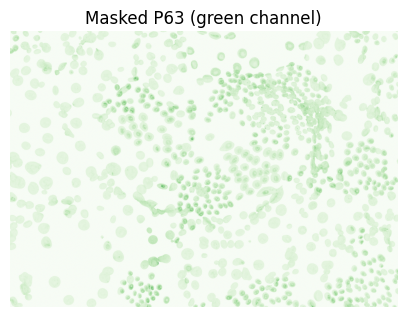

In [ ]:
# Path to P63 Images
p63_path = '/content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/P63_Stained'

p63_images = sorted(glob(os.path.join(p63_path, "*.tif")))

print(f"Found {len(p63_images)} P63 images")

masked_p63_gray_list = []
masked_p63_green_list = []

for masks, p63_file in zip(all_masks, p63_images):
    # load & preprocess
    p63 = io.imread(p63_file)
    p63_uint8 = p63.astype(np.uint8).astype(np.float32)
    p63_gray  = cv2.cvtColor(p63_uint8, cv2.COLOR_BGR2GRAY).astype(np.float32)
    green_chan = p63[..., 1]               # BGR ordering: index 1 is G
    binary    = (masks > 0).astype(np.float32)

    # element‐wise mask
    masked_gray = p63_gray * binary
    masked_p63_gray_list.append(masked_gray)

    masked_green = green_chan * binary
    masked_p63_green_list.append(masked_green)

    # —— DISPLAY masked gray ——
    plt.figure(figsize=(5,5))
    plt.imshow(masked_gray, cmap='gray')
    plt.title("Masked P63 (grayscale)")
    plt.axis('off')
    plt.show()

    # —— DISPLAY masked green ——
    plt.figure(figsize=(5,5))
    plt.imshow(masked_green, cmap='Greens')
    plt.title("Masked P63 (green channel)")
    plt.axis('off')
    plt.show()

# Step 4 - Save DAPI + Stained Masks

In [ ]:
import os
import cv2
import numpy as np

# 📁 Create directories for saving
save_dir_dapi_mask = "/content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/Masks_DAPI"
save_dir_stained_masked = "/content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/Masked_Green_Original"

os.makedirs(save_dir_dapi_mask, exist_ok=True)
os.makedirs(save_dir_stained_masked, exist_ok=True)

# 💾 Save masks
for i, (name, mask, stained) in enumerate(zip(p63_images, all_masks, masked_p63_green_list)):
    base = os.path.basename(name).replace('.tif', '')

    # שמירת מסכת DAPI בינארית
    dapi_mask = (mask > 0).astype(np.uint8) * 255
    cv2.imwrite(os.path.join(save_dir_dapi_mask, f"{base}_DAPI_mask.png"), dapi_mask)

    # שמירת המסכה הירוקה כתמונה RGB (ערוץ ירוק בלבד)
    stained_uint8 = np.clip(stained, 0, 255).astype(np.uint8)
    green_rgb = np.zeros((stained.shape[0], stained.shape[1], 3), dtype=np.uint8)
    green_rgb[..., 1] = stained_uint8  # רק ערוץ ירוק פעיל

    cv2.imwrite(os.path.join(save_dir_stained_masked, f"{base}_masked_green.png"), green_rgb)

    print(f"Saved: {base}")


Saved: Position1
Saved: Position10
Saved: Position2
Saved: Position3
Saved: Position4
Saved: Position5
Saved: Position6
Saved: Position7
Saved: Position8
Saved: Position9


## Part 4: Histograms per image & combined


Plotting grayscale histograms for 10 images


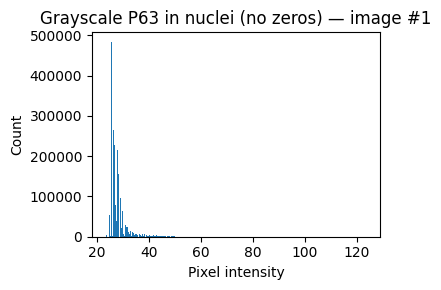

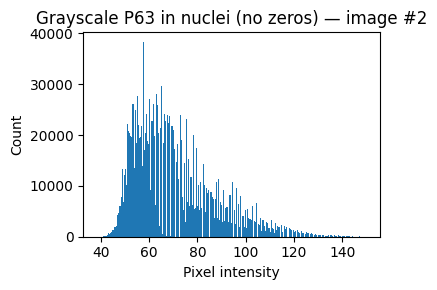

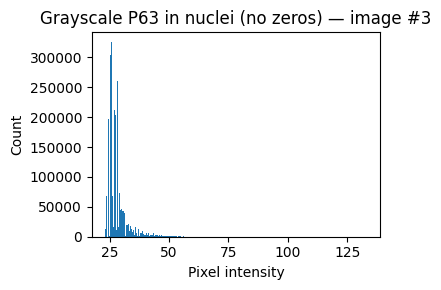

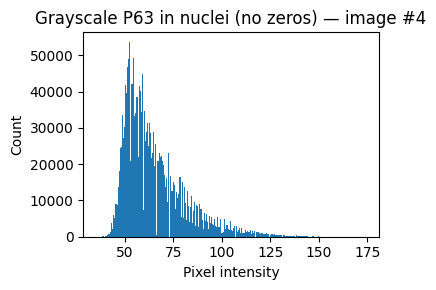

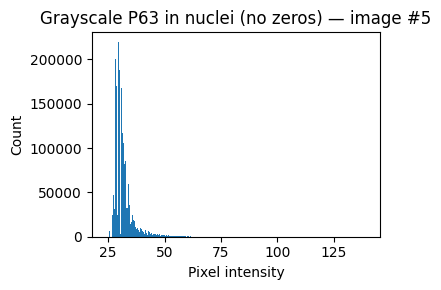

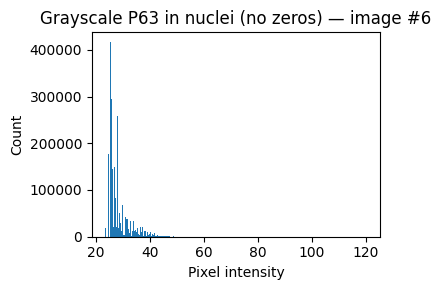

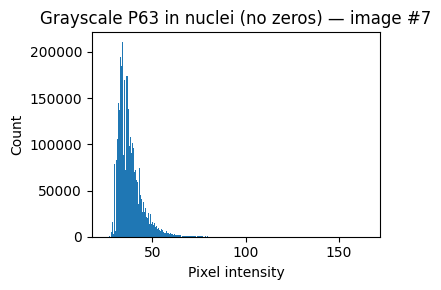

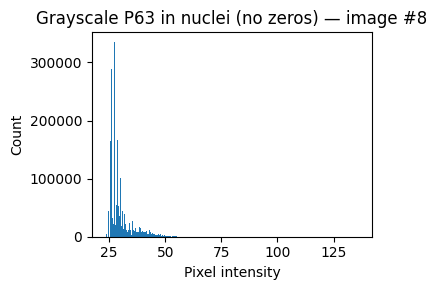

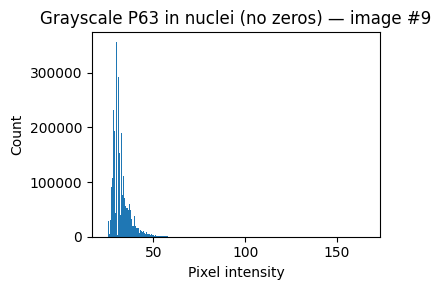

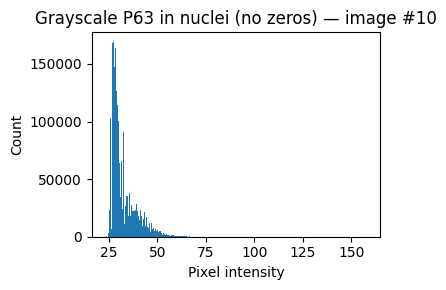

Plotting green-channel histograms for 10 images


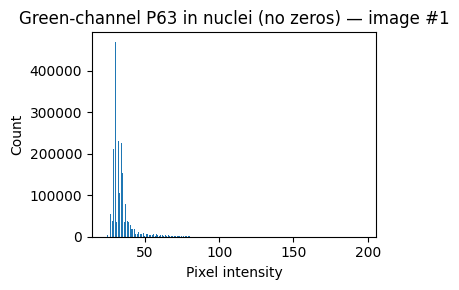

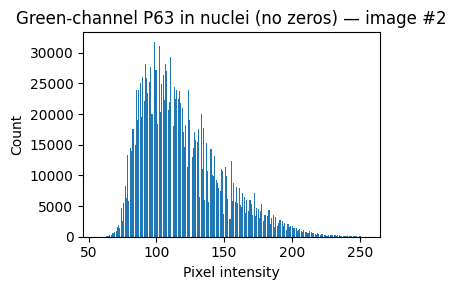

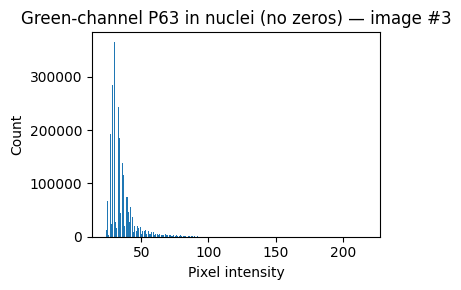

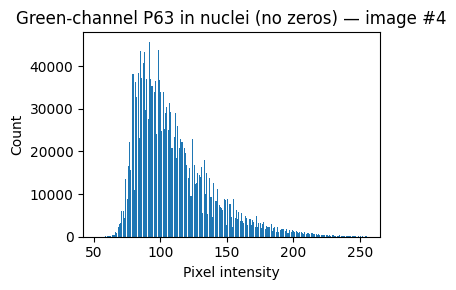

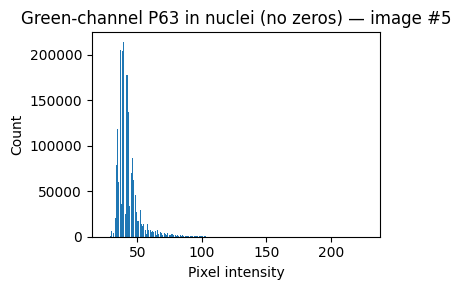

...

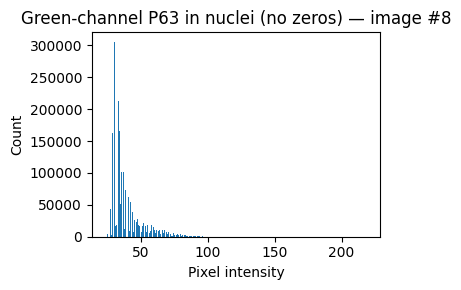

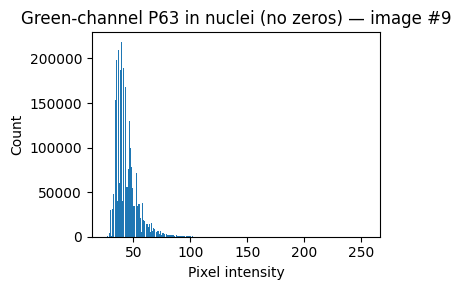

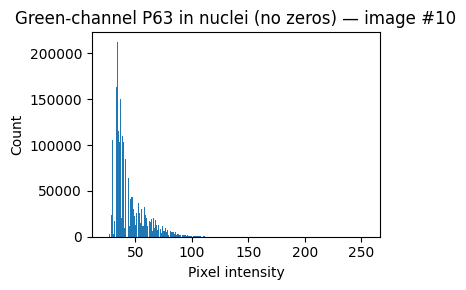

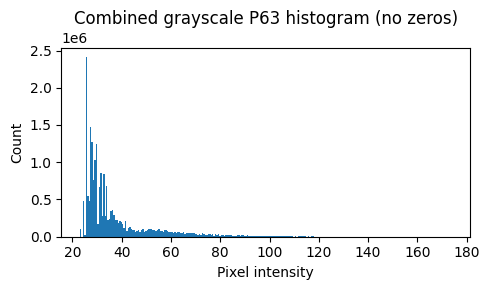

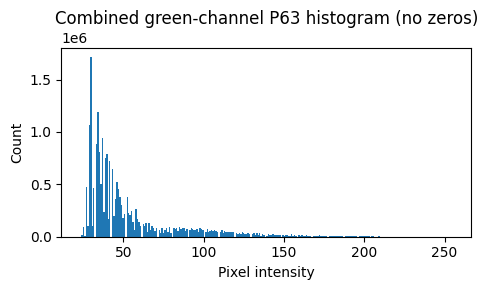

In [ ]:
# ─── Grayscale histograms (ignore zeros) ────────────────────────────────────────
print(f"Plotting grayscale histograms for {len(masked_p63_gray_list)} images")
for i, masked in enumerate(masked_p63_gray_list, start=1):
    # select only non-zero pixels
    vals = masked[masked > 0]
    if vals.size == 0:
        print(f"Image #{i}: no non-zero pixels, skipping.")
        continue

    plt.figure(figsize=(4,3))
    plt.hist(vals, bins=256, range=(vals.min(), vals.max()))
    plt.title(f"Grayscale P63 in nuclei (no zeros) — image #{i}")
    plt.xlabel("Pixel intensity")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

# ─── Green-channel histograms ───────────────────────────────────────────────────
print(f"Plotting green-channel histograms for {len(masked_p63_green_list)} images")
for i, masked in enumerate(masked_p63_green_list, start=1):
  vals = masked[masked > 0]
  if vals.size == 0:
    print(f"Image #{i}: no non-zero green pixels, skipping.")
    continue

  plt.figure(figsize=(4,3))
  plt.hist(vals, bins=256, range=(vals.min(), vals.max()))
  plt.title(f"Green-channel P63 in nuclei (no zeros) — image #{i}")
  plt.xlabel("Pixel intensity")
  plt.ylabel("Count")
  plt.tight_layout()
  plt.show()


# combined grayscale histogram
all_gray = np.concatenate([m[m > 0].ravel() for m in masked_p63_gray_list])
if all_gray.size:
    plt.figure(figsize=(5,3))
    plt.hist(all_gray, bins=256, range=(all_gray.min(), all_gray.max()))
    plt.title("Combined grayscale P63 histogram (no zeros)")
    plt.xlabel("Pixel intensity")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()
else:
    print("No non-zero pixels across all grayscale masks.")

# combined green channel histogram
all_green = np.concatenate([m[m > 0].ravel() for m in masked_p63_green_list])
if all_green.size:
  plt.figure(figsize=(5,3))
  plt.hist(all_green, bins=256, range=(all_green.min(), all_green.max()))
  plt.title("Combined green-channel P63 histogram (no zeros)")
  plt.xlabel("Pixel intensity")
  plt.ylabel("Count")
  plt.tight_layout()
  plt.show()
else:
  print("No non-zero pixels across all green-channel masks.")

# Part 5 - Save to Google Drive

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position1_GT.tif


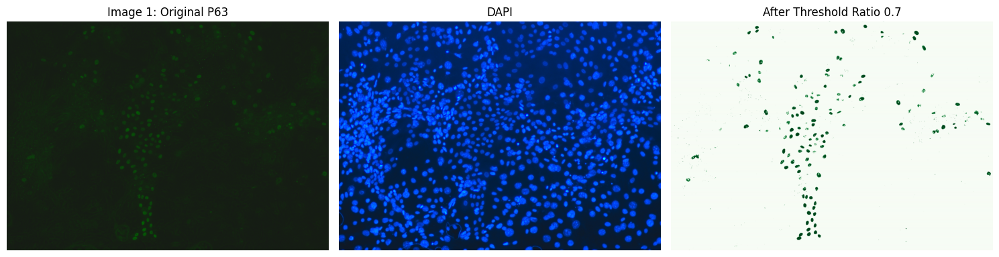

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position10_GT.tif


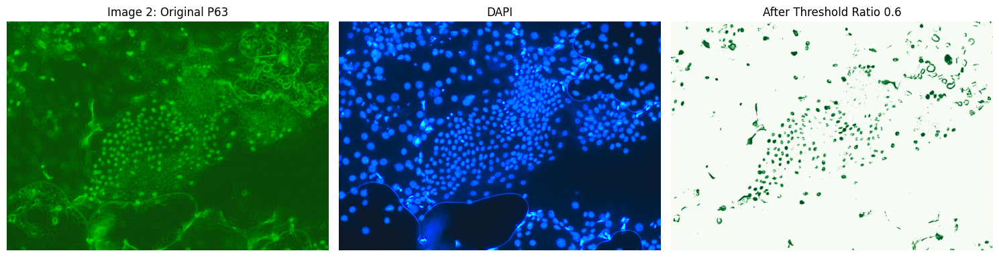

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position2_GT.tif


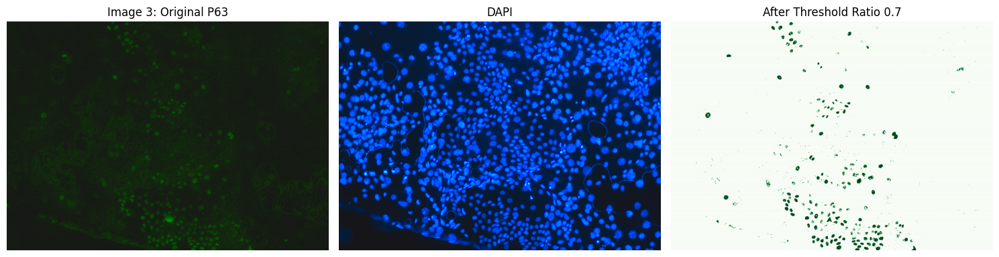

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position3_GT.tif


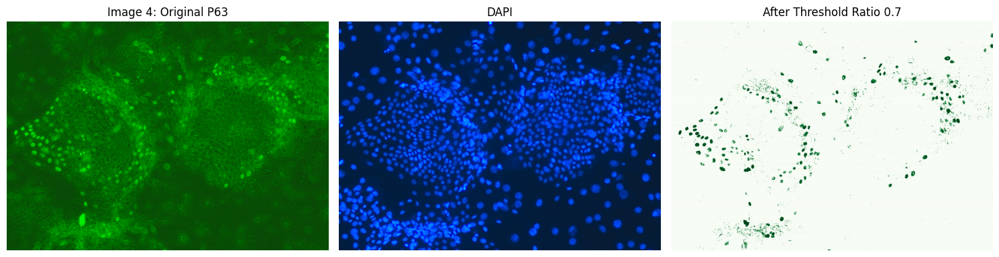

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position4_GT.tif


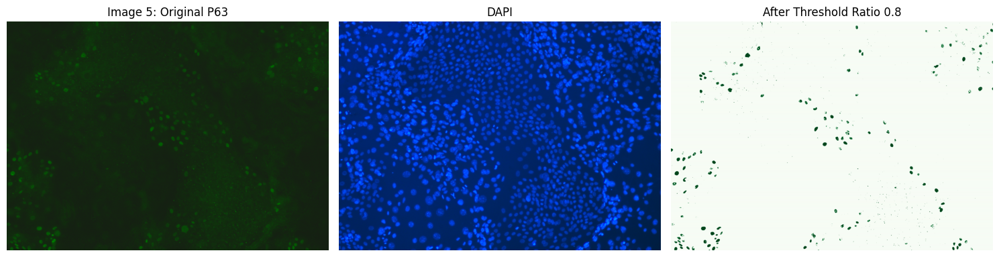

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position5_GT.tif


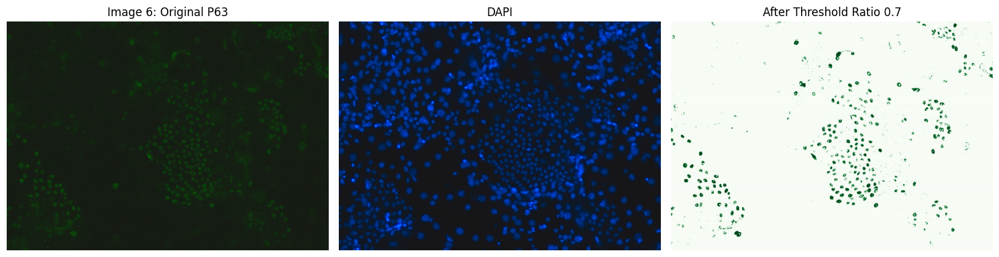

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position6_GT.tif


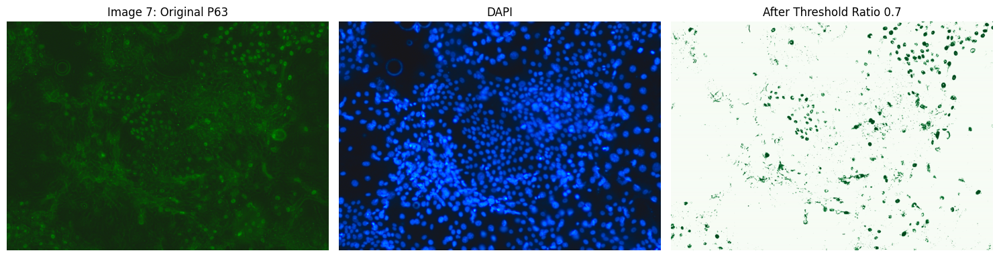

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position7_GT.tif


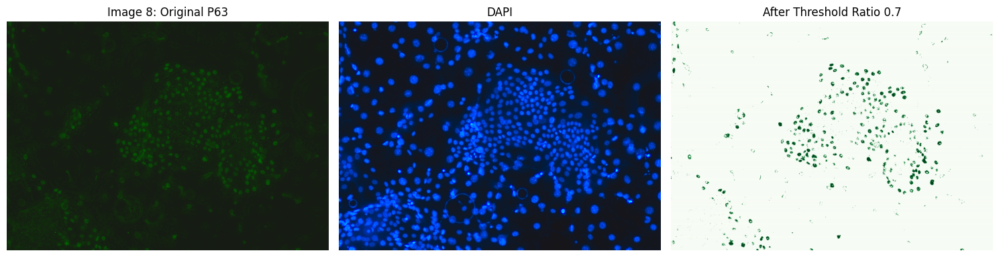

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position8_GT.tif


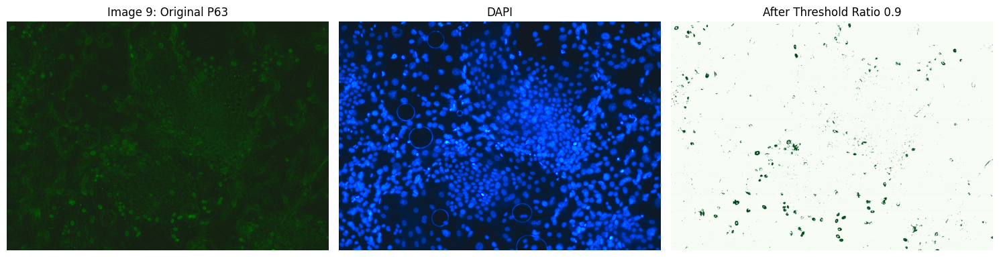

Saved: /content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded/Position9_GT.tif


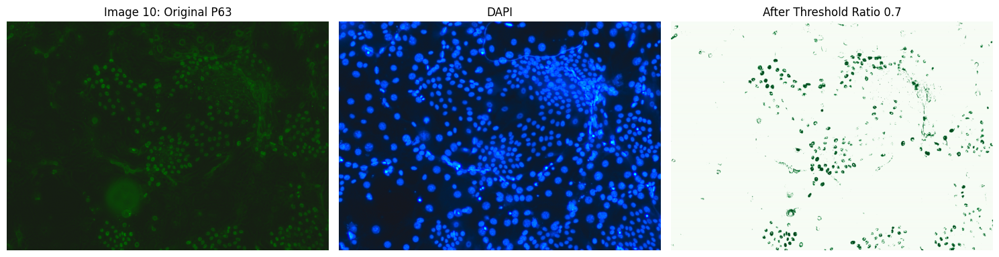

In [ ]:
import os
import cv2

# 🟦 תיקיית שמירה
gt_save_path = "/content/drive/MyDrive/final project/Part 3 - Cell Segmentation with Transfer Learning/Data/GT_Thresholded"
os.makedirs(gt_save_path, exist_ok=True)

# 🔁 לולאה על כל התמונות
for idx, ratio in enumerate(ratios):
    masked_green = masked_p63_green_list[idx]
    p63 = io.imread(p63_images[idx]).astype(np.uint8)
    dapi = io.imread(dapi_images[idx]).astype(np.uint8)

    stretched = contrast_stretch_percentile(masked_green)
    result = threshold_by_ratio(stretched, ratio)

    # ✅ שמירה
    base_name = os.path.basename(p63_images[idx]).replace('.tif', '_GT.tif')
    save_path = os.path.join(gt_save_path, base_name)
    cv2.imwrite(save_path, result.astype(np.uint8))
    print(f"Saved: {save_path}")

    # ✅ תצוגה (כמו קודם)
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(p63)
    axes[0].set_title(f"Image {idx+1}: Original P63")
    axes[0].axis('off')
    axes[1].imshow(dapi)
    axes[1].set_title("DAPI")
    axes[1].axis('off')
    axes[2].imshow(result, cmap='Greens')
    axes[2].set_title(f"After Threshold Ratio {ratio}")
    axes[2].axis('off')
    plt.tight_layout()
    plt.show()
